In [1]:
import os
import math
import glob

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2

from moviepy.editor import VideoFileClip
from IPython.display import HTML

%matplotlib inline

This image is: <class 'numpy.ndarray'> with dimesions: (720, 1280, 3)


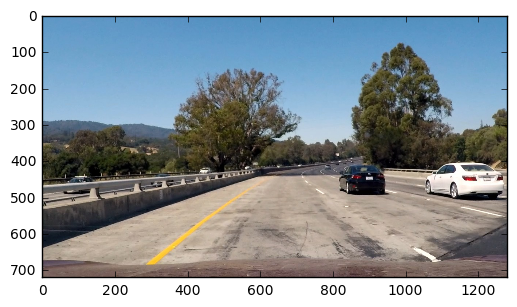

In [2]:
image = mpimg.imread('test_images/test1.jpg')
print('This image is:', type(image), 'with dimesions:', image.shape)
plt.imshow(image);

# Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

In [3]:
def load_imgs(path):
    files =  glob.glob(path) 
    imgs = [mpimg.imread(img_path) for img_path in files ]
    return imgs

def plot_imgs(imgs, cmap=None, titles=None, save=None):
    titles = titles or ['']*len(imgs) 
    columns = min(len(imgs), 5)
    rows = math.ceil(len(imgs) / columns)
    fig = plt.figure(figsize=(16,8))
    for i, img in enumerate(imgs):
        plt.subplot(rows, columns, i+1)
        plt.imshow(img, cmap=cmap)
        plt.title(titles[i])
    plt.show()
    if save:
        fig.savefig(save)

def calc_undistort(imgs):
    CROSSES = (6, 9)
    gray_images = [cv2.cvtColor(i, cv2.COLOR_RGB2GRAY) for i in imgs]
    objpoints = []
    imgpoints = []
    
    objp = np.zeros((CROSSES[0]*CROSSES[1], 3), np.float32)
    objp[:,:2] = np.mgrid[0:CROSSES[0], 0:CROSSES[1]].T.reshape(-1, 2) # x, y coordinates

    for i, gray in enumerate(gray_images):
        ret, corners = cv2.findChessboardCorners(gray, CROSSES, None)
        if ret:
            imgs[i] = cv2.drawChessboardCorners(imgs[i], CROSSES, corners, ret)
            imgpoints.append(corners)
            objpoints.append(objp)
            
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)
    imgs = [cv2.undistort(img, mtx, dist, None, mtx) 
            for img in imgs]
            
    return imgs, mtx, dist

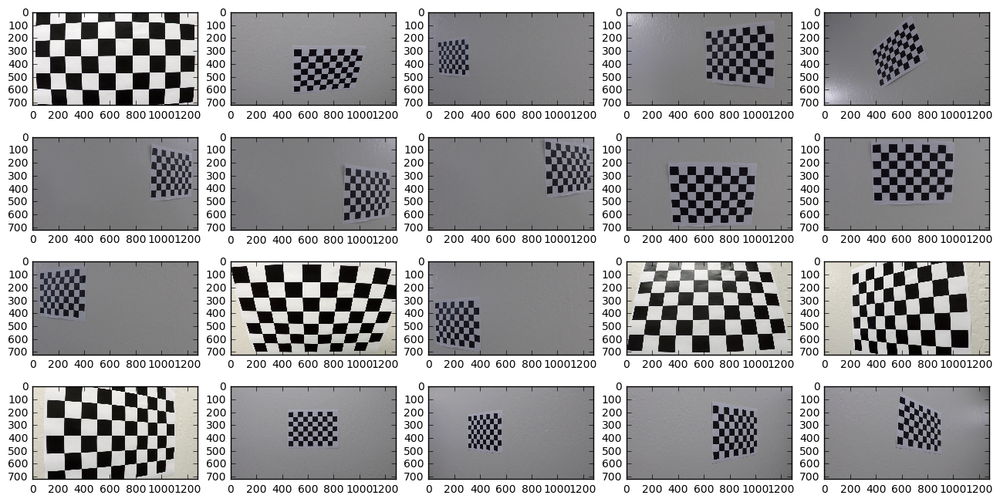

Undistorted images and found crosses.


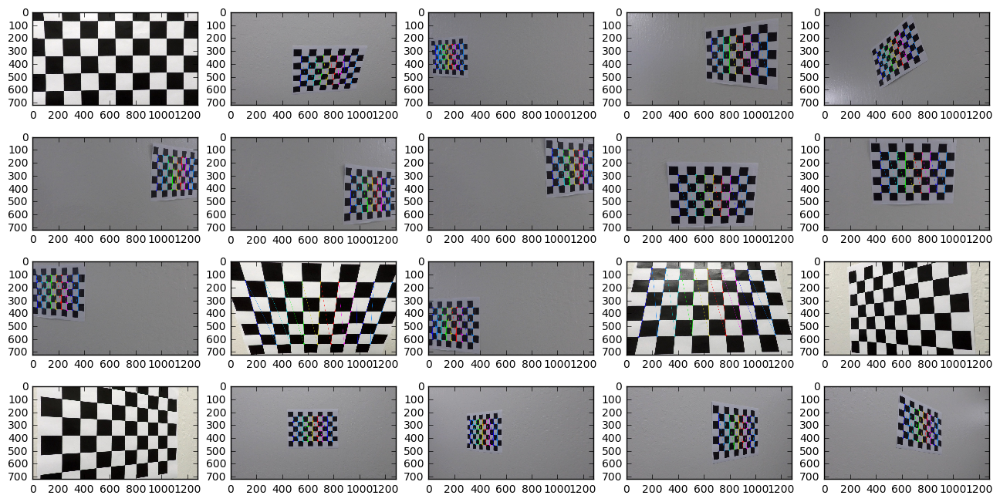

In [4]:
calibration_imgs = load_imgs('./camera_cal/calibration*.jpg')
plot_imgs(calibration_imgs, save='./output_images/calibration_undistort.jpg')
undistorded_imgs, mtx, dist = calc_undistort(calibration_imgs)
print('Undistorted images and found crosses.')
plot_imgs(undistorded_imgs, save='./output_images/calibration_undistort_and_crossses.jpg')

# Apply the distortion correction to the raw image.

In [5]:
def undistort_img(img, mtx, dist):
    undist = cv2.undistort(img, mtx, dist, None, mtx) 
    return undist

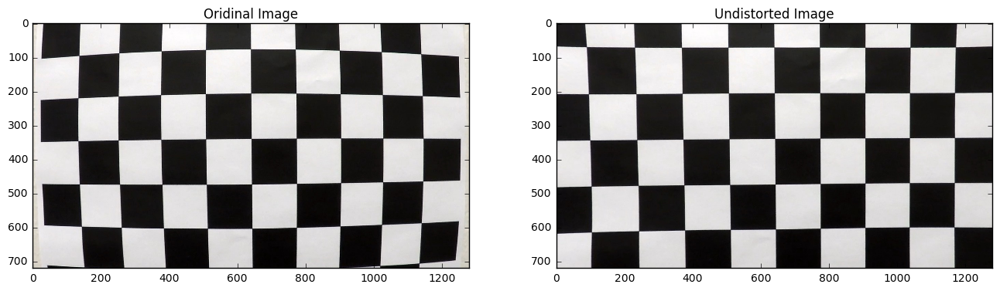

In [6]:
image = calibration_imgs[0]
plot_imgs([image, undistort_img(image, mtx, dist)], None, ['Oridinal Image', 'Undistorted Image'],
          save='./output_images/calibration_original_and_undistort.jpg')

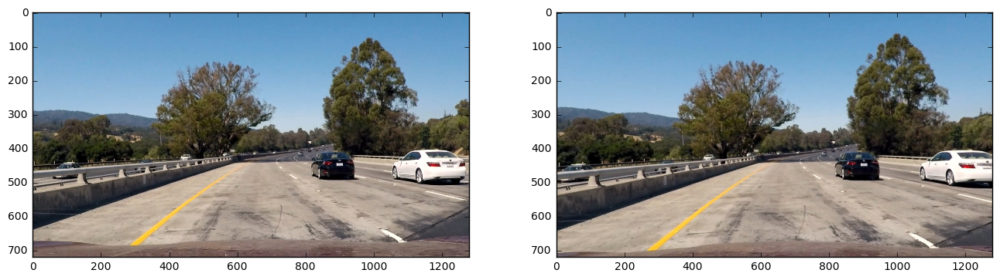

In [7]:
image = mpimg.imread('test_images/test1.jpg')
image_2 = undistort_img(image, mtx, dist)
plot_imgs([image, image_2], save='./output_images/test1_original_and_undistort.jpg')

In [8]:
def weighted_img(img, initial_img, α=0.8, β=1., λ=0.):
    """
    'img' is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    'initial_img' should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + λ
    NOTE: initial_img and img must be the same shape!
    e.g. usage: # image =  weighted_img(image, image_orig, α=0.5, β=0.5, λ=0.)
    """
    return cv2.addWeighted(initial_img, α, img, β, λ)


## Apply a perspective transform to rectify binary image ("birds-eye view").

In [9]:
def get_perspective_transform(image, src_in = None, dst_in = None, display=False):
    img_size = image.shape
    if src_in is None:
        src = np.array([[585 /1280*img_size[1], 455/720*img_size[0]],
                        [705 /1280*img_size[1], 455/720*img_size[0]],
                        [1130/1280*img_size[1], 720/720*img_size[0]],
                        [190 /1280*img_size[1], 720/720*img_size[0]]], np.float32)
    else:
        src = src_in
        
    if dst_in is None:
        dst = np.array([[300 /1280*img_size[1], 100/720*img_size[0]],
                        [1000/1280*img_size[1], 100/720*img_size[0]],
                        [1000/1280*img_size[1], 720/720*img_size[0]],
                        [300 /1280*img_size[1], 720/720*img_size[0]]], np.float32)
    else:
        dst = dst_in
        
    warp_m = cv2.getPerspectiveTransform(src, dst)
    warp_minv = cv2.getPerspectiveTransform(dst, src)

    if display:
        image_poly = cv2.fillConvexPoly(np.copy(image), src.astype(np.int32), 128)
        image_poly = weighted_img(image_poly, image, α=0.5, β=0.5, λ=0.)
        im2 = cv2.warpPerspective(image_poly, warp_m, (image.shape[1], image.shape[0]), flags=cv2.INTER_LINEAR)
        plot_imgs([image_poly, im2], cmap='gray', titles=['Original image', 'Bird-view image'], save=display)
        
    return warp_m, warp_minv

def find_edges(image, ksize = 11, mask_half=False):
    
#     blur = cv2.GaussianBlur(image, (ksize, ksize), 0)
    hls = cv2.cvtColor(image.astype(np.uint8), cv2.COLOR_RGB2HLS)
#     gray = cv2.cvtColor(blur.astype(np.uint8), cv2.COLOR_RGB2GRAY)
    gray = (0.5*image[:,:,0] + 0.4*image[:,:,1] + 0.1*image[:,:,2]).astype(np.uint8)
    s = hls[:,:,2]
    
    _, gray_binary = cv2.threshold(gray.astype('uint8'), 150, 255, cv2.THRESH_BINARY)

    total_px = image.shape[0]*image.shape[1]
    laplacian = cv2.Laplacian(gray, cv2.CV_32F, ksize=21)
    mask_three = (laplacian < 0.15*np.min(laplacian)).astype(np.uint8)
    if cv2.countNonZero(mask_three)/total_px < 0.01:
        laplacian = cv2.Laplacian(gray, cv2.CV_32F, ksize=21)
        mask_three = (laplacian < 0.075*np.min(laplacian)).astype(np.uint8)

    _, s_binary = cv2.threshold(s.astype('uint8'), 150, 255, cv2.THRESH_BINARY)
    mask_two = s_binary

    combined_binary = np.clip(cv2.bitwise_and(gray_binary, 
                        cv2.bitwise_or(mask_three, mask_two)), 0, 1).astype('uint8')

    # Mask out top half of image to reduce distractions
    # Only used when unwarped image is passed in
    if mask_half:
        print(math.ceil(image.shape[0]//2))
        combined_binary[:math.ceil(image.shape[0]//2)] = 0

    return combined_binary

def find_perspective_points(image):
    edges = find_edges(image, True)
    
    # Computing perspective points automatically
    rho = 2              # distance resolution in pixels of the Hough grid
    theta = 1*np.pi/180  # angular resolution in radians of the Hough grid
    threshold = 100       # minimum number of votes (intersections in Hough grid cell)
    min_line_length = 100 # minimum number of pixels making up a line
    max_line_gap = 25    # maximum gap in pixels between connectable line segments

    angle_min_mag = 20*np.pi/180
    angle_max_mag = 65*np.pi/180

    lane_markers_x = [[], []]
    lane_markers_y = [[], []]
    
    masked_edges = np.copy(edges)
    masked_edges[:edges.shape[0]*6//10,:] = 0
    lines = cv2.HoughLinesP(masked_edges, rho, theta, threshold, min_line_length, max_line_gap)
    for line in lines:
        for x1,y1,x2,y2 in line:
            theta = math.atan2(y1-y2, x2-x1)
            rho = ((x1+x2)*math.cos(theta) + (y1+y2)*math.sin(theta))/2
            if (abs(theta) >= angle_min_mag and abs(theta) <= angle_max_mag):
                if theta > 0: # positive theta is downward in image space?
                    i = 0 # Left lane marker
                else:
                    i = 1 # Right lane marker
                lane_markers_x[i].append(x1)
                lane_markers_x[i].append(x2)
                lane_markers_y[i].append(y1)
                lane_markers_y[i].append(y2)

    if len(lane_markers_x[0]) < 1 or len(lane_markers_x[1]) < 1:
        # Failed to find two lane markers
        return None
    
    
    p_left  = np.polyfit(lane_markers_y[0], lane_markers_x[0], 1)
    p_right = np.polyfit(lane_markers_y[1], lane_markers_x[1], 1)
    
    # Find intersection of the two lines
    apex_pt = np.linalg.solve([[p_left[0], -1], [p_right[0], -1]], [-p_left[1], -p_right[1]])
    top_y = math.ceil(apex_pt[0] + 0.075*edges.shape[0])
    
    bl_pt = math.ceil(np.polyval(p_left, edges.shape[0]))
    tl_pt = math.ceil(np.polyval(p_left, top_y))
    
    br_pt = math.ceil(np.polyval(p_right, edges.shape[0]))
    tr_pt = math.ceil(np.polyval(p_right, top_y))

    src = np.array([[tl_pt, top_y],
                    [tr_pt, top_y],
                    [br_pt, edges.shape[0]],
                    [bl_pt, edges.shape[0]]], np.float32)

    get_perspective_transform(edges, src_in = src, dst_in = None, display=False) 
    return src

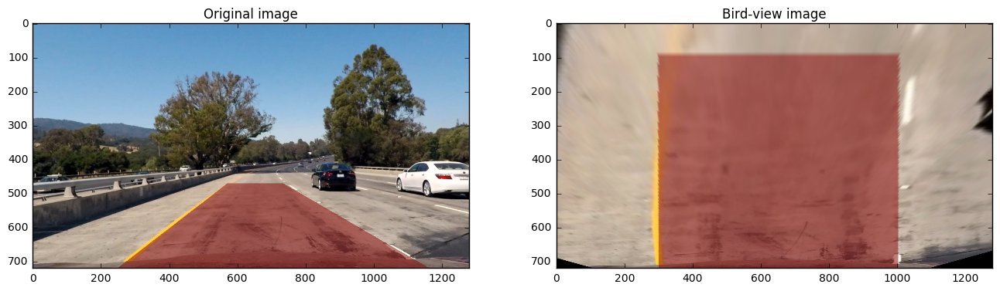

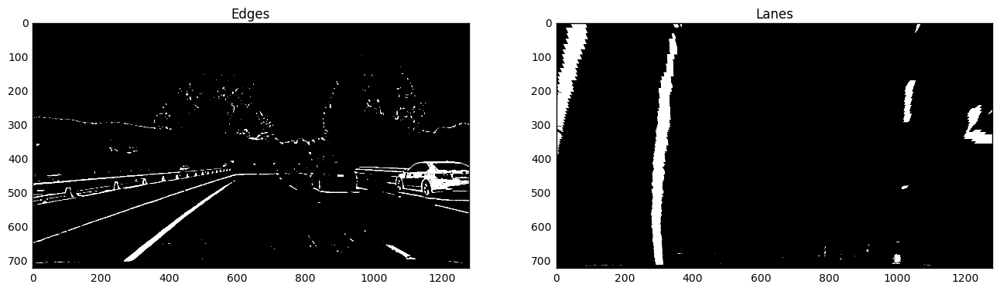

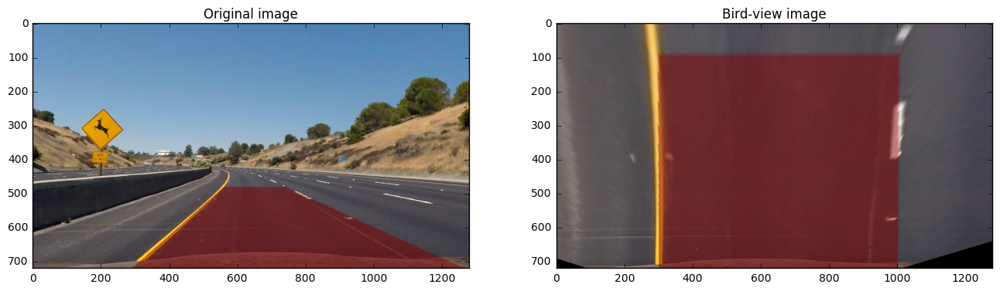

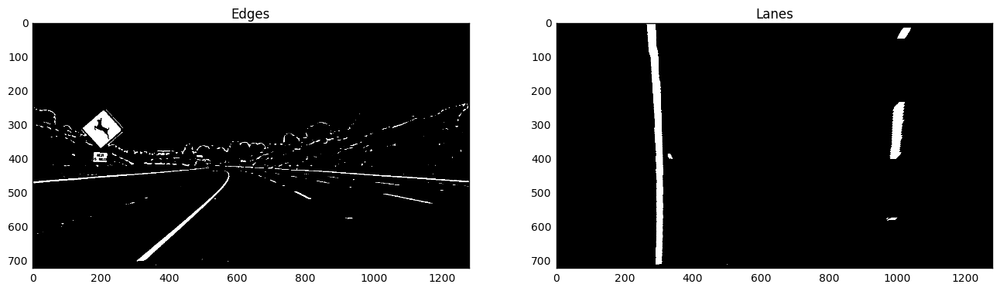

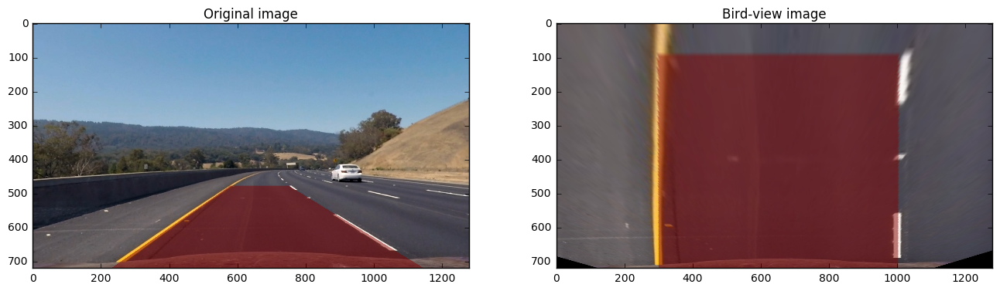

...

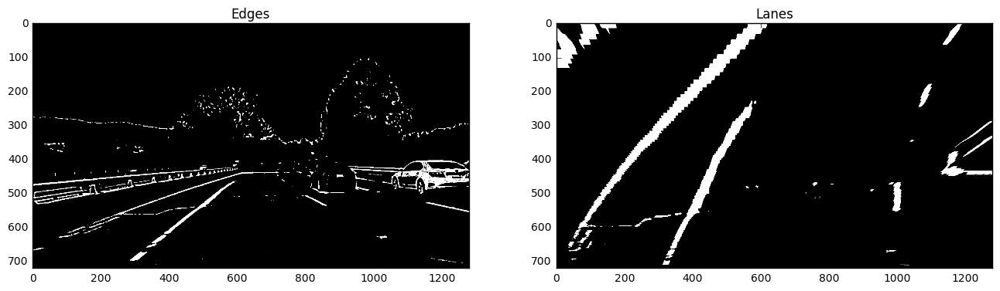

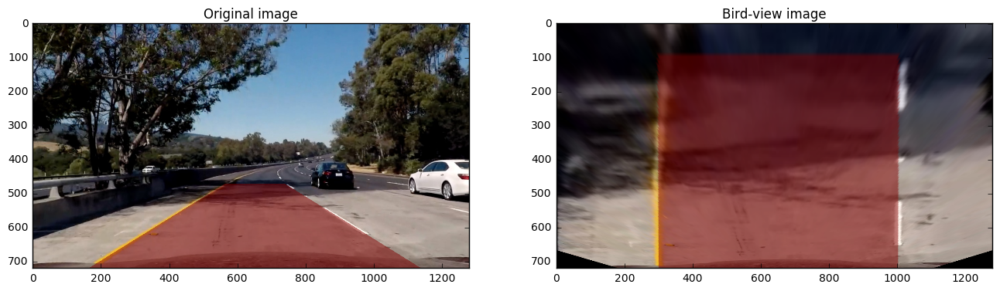

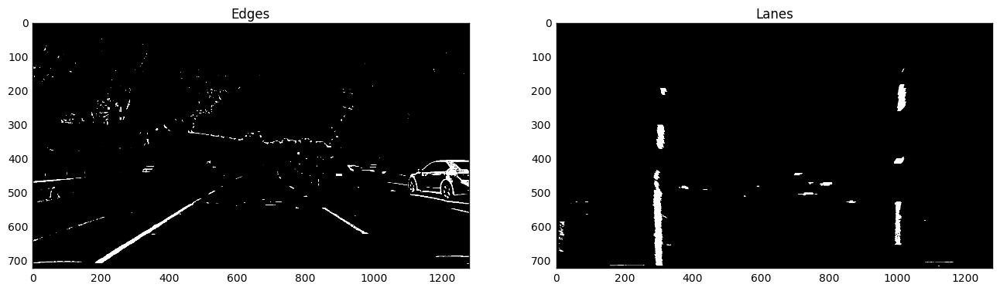

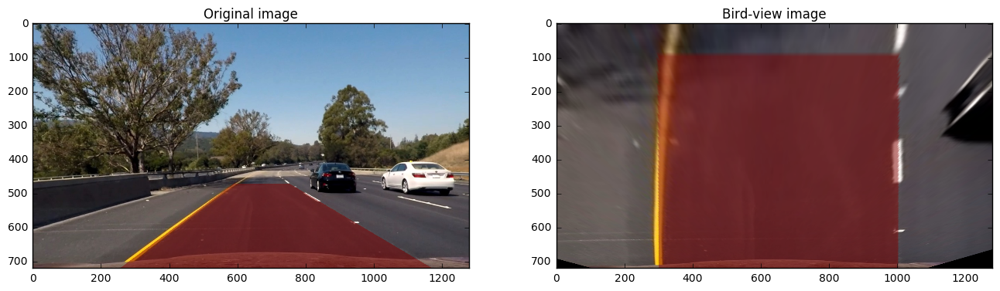

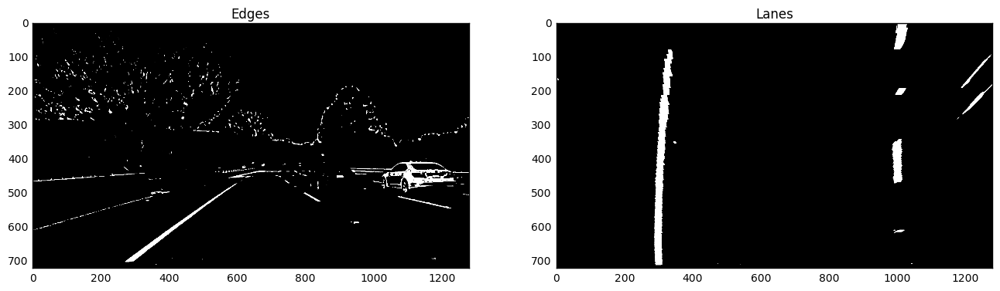

In [10]:
imgs = load_imgs('./test_images/test*.jpg')
image = imgs[3]


for i, image in enumerate(imgs):
    undist = undistort_img(image, mtx, dist)
    yellow = (np.array([160, 128, 0]), np.array([255, 255, 128]))
    hls = cv2.cvtColor(undist, cv2.COLOR_RGB2HLS)

    src = find_perspective_points(undist)
    warp_m, warp_minv = get_perspective_transform(undist, src, display='output_images/bird-view-'+str(i))

    edges = find_edges(undist)
    lanes = cv2.warpPerspective(edges, warp_m, (undist.shape[1], undist.shape[0]), flags=cv2.INTER_LINEAR)
    plot_imgs([edges, lanes],titles=['Edges', 'Lanes'], cmap='gray', save='output_images/edges-lanes-'+str(i))

# Use color transforms, gradients, etc., to create a thresholded binary image. - Experiments

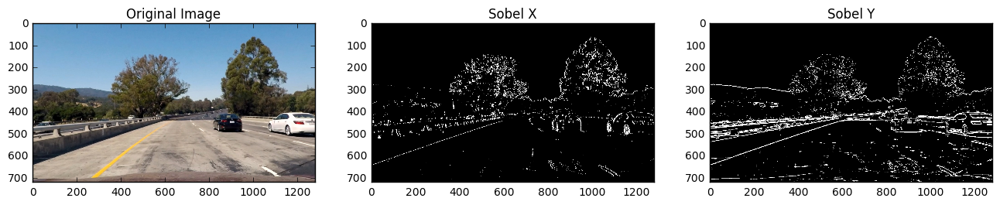

In [11]:
# Sobel derivates of the image
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, threshold=(30, 200)):
    # Convert to grayscale
    thresh_min, thresh_max = threshold
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Return the result
    return binary_output

image = mpimg.imread('test_images/test1.jpg')
image = undistort_img(image, mtx, dist)
# image = apply_perspective_transform(image)

sxbinary = abs_sobel_thresh(image, orient='x')
sybinary = abs_sobel_thresh(image, orient='y')

# show images
plt.figure(figsize=(16,8)); 
plt.subplot(1, 3, 1);
plt.title("Original Image")
plt.imshow(image);
plt.subplot(1, 3, 2);
plt.title("Sobel X")
plt.imshow(sxbinary, cmap='gray');
plt.subplot(1, 3, 3);
plt.title("Sobel Y")
plt.imshow(sybinary, cmap='gray');

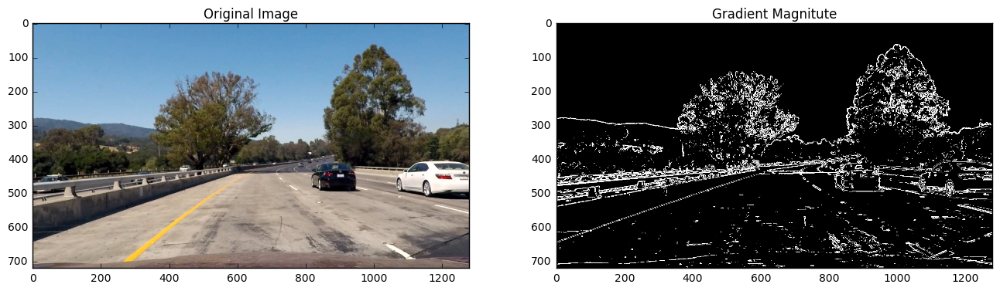

In [12]:
# Define a function to return the magnitude of the gradient
# for a given sobel kernel size and threshold values
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output


image = mpimg.imread('test_images/test1.jpg')
image = undistort_img(image, mtx, dist)
# image = apply_perspective_transform(image)

mag_binary = mag_thresh(image, sobel_kernel=3, mag_thresh=(30, 100))

# show images
plt.figure(figsize=(16,8));
plt.subplot(1,2,1)
plt.title("Original Image")
plt.imshow(image);
plt.subplot(1,2,2)
plt.title("Gradient Magnitute")
plt.imshow(mag_binary, cmap='gray');


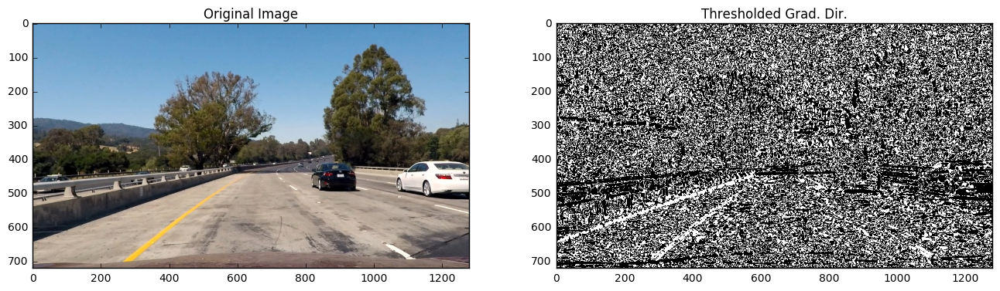

In [13]:
# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output
    
image = mpimg.imread('test_images/test1.jpg')
image = undistort_img(image, mtx, dist)

dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.7, 1.3))

# show images
plt.figure(figsize=(16,8));
plt.subplot(1,2,1)
plt.title("Original Image")
plt.imshow(image);
plt.subplot(1,2,2)
plt.title("Thresholded Grad. Dir.")
plt.imshow(dir_binary, cmap='gray');


In [14]:
# Choose a Sobel kernel size
ksize = 3 # Choose a larger odd number to smooth gradient measurements

# Apply each of the thresholding functions
gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, threshold=(0, 255))
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, threshold=(0, 255))
mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(0, 255))
dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0, np.pi/2))

combined = np.zeros_like(dir_binary)
combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
# Here is an example of a binary result from multiple thresholds.

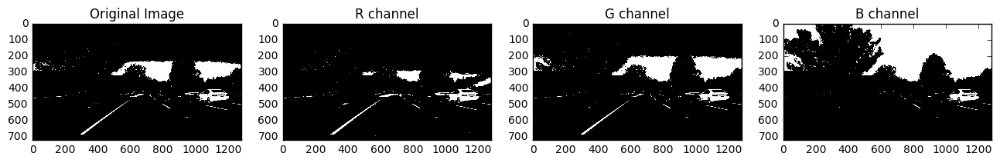

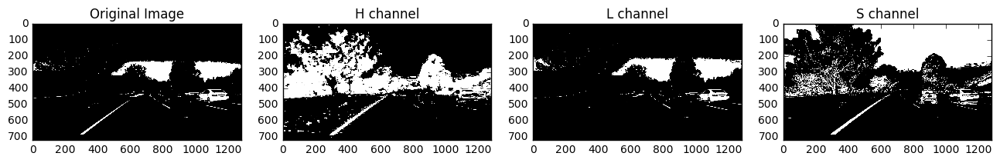

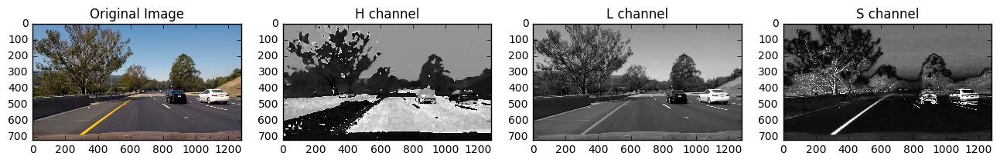

In [15]:
image = mpimg.imread('test_images/test6.jpg')

thresh = (180, 255)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
binary = np.zeros_like(gray)
binary[(gray > thresh[0]) & (gray <= thresh[1])] = 1

R = image[:,:,0]
G = image[:,:,1]
B = image[:,:,2]

R_binary = np.zeros_like(gray)
R_binary[(R > thresh[0]) & (R <= thresh[1])] = 1
G_binary = np.zeros_like(gray)
G_binary[(G > thresh[0]) & (G <= thresh[1])] = 1
B_binary = np.zeros_like(gray)
B_binary[(B > thresh[0]) & (B <= thresh[1])] = 1

# show images
plt.figure(figsize=(16,8));
plt.subplot(1,4,1)
plt.title("Original Image")
plt.imshow(binary, cmap='gray');
plt.subplot(1,4,2)
plt.title("R channel")
plt.imshow(R_binary, cmap='gray');
plt.subplot(1,4,3)
plt.title("G channel")
plt.imshow(G_binary, cmap='gray');
plt.subplot(1,4,4)
plt.title("B channel")
plt.imshow(B_binary, cmap='gray');

# HLS

hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
H = hls[:,:,0]
L = hls[:,:,1]
S = hls[:,:,2]



thresh = (15, 100)
H_binary = np.zeros_like(gray)
H_binary[(H > thresh[0]) & (H <= thresh[1])] = 1

thresh = (180, 255)
L_binary = np.zeros_like(gray)
L_binary[(L > thresh[0]) & (L <= thresh[1])] = 1

thresh = (90, 255)
S_binary = np.zeros_like(gray)
S_binary[(S > thresh[0]) & (S <= thresh[1])] = 1

# show HLS bimnary images
plt.figure(figsize=(16,8));
plt.subplot(1,4,1)
plt.title("Original Image")
plt.imshow(binary, cmap='gray');
plt.subplot(1,4,2)
plt.title("H channel")
plt.imshow(H_binary, cmap='gray');
plt.subplot(1,4,3)
plt.title("L channel")
plt.imshow(L_binary, cmap='gray');
plt.subplot(1,4,4)
plt.title("S channel")
plt.imshow(S_binary, cmap='gray');

# show HLS original images
plt.figure(figsize=(16,8));
plt.subplot(1,4,1)
plt.title("Original Image")
plt.imshow(image);
plt.subplot(1,4,2)
plt.title("H channel")
plt.imshow(H, cmap='gray');
plt.subplot(1,4,3)
plt.title("L channel")
plt.imshow(L, cmap='gray');
plt.subplot(1,4,4)
plt.title("S channel")
plt.imshow(S, cmap='gray');

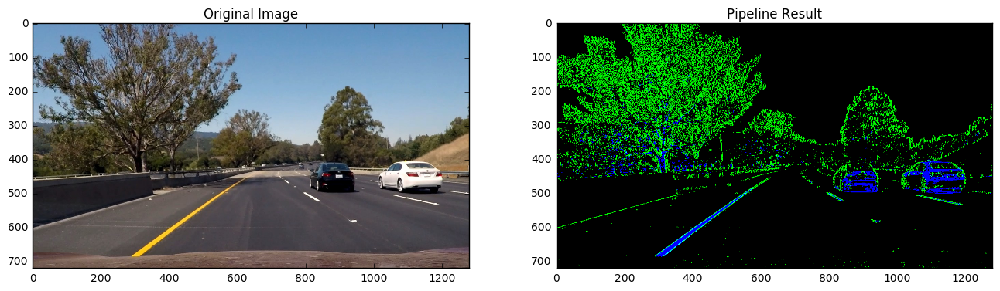

In [16]:
def pipeline(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    # Convert to HSV color space and separate the V channel
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hsv[:,:,1]
    s_channel = hsv[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))
    return color_binary
    
result = pipeline(image)

# show images
plt.figure(figsize=(16,8));
plt.subplot(1,2,1)
plt.title("Original Image")
plt.imshow(image);
plt.subplot(1,2,2)
plt.title("Pipeline Result")
plt.imshow(result, cmap='gray');


In [17]:
# Define a class to receive the characteristics of each line detection
import collections
from itertools import chain, repeat
from functools import reduce

ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meteres per pixel in x dimension

class Lane():
    def __init__(self, base_pt, img_size, cache_length):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = collections.deque(maxlen=cache_length)
        self.recent_yfitted = collections.deque(maxlen=cache_length)
        
        #average x values of the fitted line over the last n iterations
        self.bestx = None   
        
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.insanity = 0.0 
                
        self.current_xfit = None
        self.roi_mask = None
        
        self.img_size = img_size
        self.base_pt = base_pt
        
        self.yvals = np.linspace(0, img_size[0], 101)
        self.mask = np.ones(img_size, dtype=np.uint8)*255
        
        self.dropped_frames = 0
    
    def add_lane_pixels(self, x, y):
        # Use all pixels from previous detections for curve fit
        weights = np.ones(len(self.recent_xfitted))
        if len(weights) > 1:
            weights[0] = 0.8
            weights[1:] = 0.2/(len(weights) - 1)

            w_x = reduce(lambda a,b: a + b[0]*b[1], zip(weights, self.recent_xfitted), np.zeros(len(self.yvals)))
            w_y = reduce(lambda a,b: a + b[0]*b[1], zip(weights, self.recent_yfitted), np.zeros(len(self.yvals)))
        else:
            w_x, w_y = [], []
        x_hist = np.fromiter(chain(w_x, x), np.int32)
        y_hist = np.fromiter(chain(w_y, y), np.int32)

        try:
            p_lane = np.polyfit(y_hist, x_hist, 2)
            rad_curv = self.compute_rad_curv(x_hist, y_hist)
            self.detected = self.sanity_check_lane(rad_curv)
        except Exception as e:
            print(e)
            self.detected = False

        if self.detected and len(p_lane) == 3:
            x_fit = p_lane[0]*self.yvals**2 + p_lane[1]*self.yvals + p_lane[2]

            self.current_xfit = x_fit   # For drawing

            self.recent_xfitted.append(x_fit)
            self.recent_yfitted.append(self.yvals)

            self.radius_of_curvature = rad_curv
            self.current_fit = p_lane
            self.dropped_frames = 0
        else:
            # Sanity check failed
            # Use last fit if current one failed
            p_lane = self.current_fit
            rad_curv = self.radius_of_curvature
            x_fit = p_lane[0]*self.yvals**2 + p_lane[1]*self.yvals + p_lane[2]
            self.dropped_frames += 1

        # Update ROI mask
        self.mask.fill(0)
        # http://stackoverflow.com/a/35902430/538379
        pts = np.transpose(np.vstack([x_fit, self.yvals])).reshape((-1,1,2)).astype(np.int32)
        cv2.drawContours(self.mask, pts, -1, (255,255,255), thickness=80)
        
    @staticmethod
    def compute_rad_curv(xvals, yvals):
        fit_cr = np.polyfit(yvals*ym_per_pix, xvals*xm_per_pix, 2)
        y_eval = np.max(yvals)
        curverad = ((1 + (2*fit_cr[0]*y_eval + fit_cr[1])**2)**1.5) \
                                     /np.absolute(2*fit_cr[0])
        return curverad
        
        
    def sanity_check_lane(self, R):
        """
        Checks new radius of curvature `R` against the radius stored in the object.
        """
        # Return true if there is no prior data
        if self.radius_of_curvature is None:
            return True
        
        k = 1/R   # Curvature is a better measure to track
        R0 = self.radius_of_curvature
        k0 = 1/self.radius_of_curvature
#         return abs(k-k0)/k0 <= 0.05
#         self.insanity = abs(k-k0)/k0
        self.insanity = abs(R-R0)/R0
        return self.insanity <= 0.5  # Max change from frame to frame is 200%
            
        
    def detect_from_mask(self, image):
        mask_lanes = cv2.bitwise_and(image, self.mask)
        all_pts = cv2.findNonZero(mask_lanes)
        if all_pts is not None:
            all_pts = all_pts.reshape((-1,2))
            self.add_lane_pixels(all_pts[:,0], all_pts[:,1])
        else:
            self.detected = False
        
    def draw_lane(self, image):
        """
        Draws lane on given image
        """
        pts = np.array([np.transpose(np.vstack([self.current_xfit, self.yvals]))])
        cv2.fillPoly(image, np.int_([pts]), (0,255, 0))
        return image
    
def reject_outliers(x_list, y_list):
    if not x_list or not y_list:
        return x_list, y_list
    mu_x, mu_y = np.mean(x_list), np.mean(y_list)
    sig_x, sig_y = np.std(x_list), np.std(y_list)
    new_x, new_y = zip(*[(x, y) for (x,y) in zip(x_list, y_list) 
                                 if abs(x - mu_x) < 2*sig_x and abs(y - mu_y) < 2*sig_y])
    return new_x, new_y

def histogram_lane_detection(image, left_lane, right_lane, base_pts, num_bands = 10, window_width = 0.2):
    """Uses histogram and sliding window to detect lanes from scratch"""

    height = image.shape[0]
    band_height = int(1./num_bands * height)   # Divide image into horizontal bands
    band_width = int(window_width*image.shape[1])
    
    l_x, l_y, r_x, r_y = [], [], [], []
    
    base_left, base_right = base_pts

    idx_left, idx_right = base_pts
    for i in reversed(range(num_bands)):
        w_left = image[i*band_height:(i+1)*band_height,base_left-band_width//2:base_left+band_width//2]
        w_right = image[i*band_height:(i+1)*band_height,base_right-band_width//2:base_right+band_width//2]
        
        left_y_pt, left_x_pt = np.nonzero(w_left)
        right_y_pt, right_x_pt = np.nonzero(w_right)
        
        l_x.extend(left_x_pt + base_left-band_width//2)
        l_y.extend(left_y_pt + i*band_height)
        r_x.extend(right_x_pt+ base_right-band_width//2)
        r_y.extend(right_y_pt+ i*band_height)

        # Find 'x' with maximum nonzero elements as baseline for next window
        s_left = np.sum(w_left, axis=0)
        s_right = np.sum(w_right, axis=0)
        if np.any(s_left > 0):
            base_left = np.argmax(s_left) + base_left-band_width//2
        if np.any(s_right > 0):
            base_right = np.argmax(s_right) + base_right-band_width//2

    l_x, l_y = reject_outliers(l_x, l_y)
    r_x, r_y = reject_outliers(r_x, r_y)
    
    left_lane.add_lane_pixels(l_x, l_y)
    right_lane.add_lane_pixels(r_x, r_y)

    return left_lane, right_lane

In [18]:
from scipy.signal import find_peaks_cwt

def find_base_points(lanes, min_peak = 25.0):
    """Uses histogram to find possible base points for lane lines"""
    hist = np.sum(lanes[int(lanes.shape[0]*0.5):,:], axis=0)
    
    widths = [100]
    idx = find_peaks_cwt(hist, widths, max_distances=widths, noise_perc=50) 
    if len(idx) < 2:
        return None

    # Avoid edges
    idx = [i for i in idx if i > lanes.shape[1]*0.1
                             and i < lanes.shape[1]*0.9
                             and max(hist[i-50:i+50]) > min_peak]        
    return [min(idx), max(idx)], hist

[301, 1000]


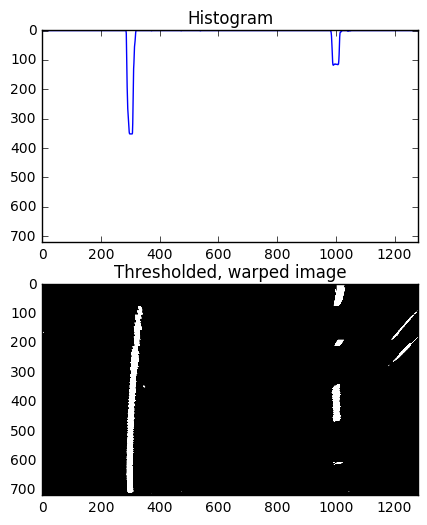

In [19]:
base_pts, hist = find_base_points(lanes)
print(base_pts)

fig = plt.figure(figsize=(6,6))
        
ax1 = plt.subplot(211, aspect='equal', adjustable='box-forced')
plt.plot(hist)
plt.ylim([0, 500])
plt.xlim([0, 1280])
plt.title('Histogram')

plt.subplot(212, aspect='equal', adjustable='box-forced', sharex=ax1, sharey=ax1)
plt.imshow(lanes, cmap='gray')
plt.title('Thresholded, warped image')
plt.show()
fig.savefig('output_images/histogram')


CPU times: user 624 ms, sys: 57.3 ms, total: 681 ms
Wall time: 539 ms
CPU times: user 421 ms, sys: 22.5 ms, total: 443 ms
Wall time: 209 ms


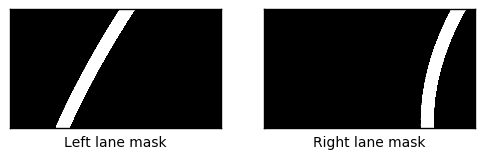

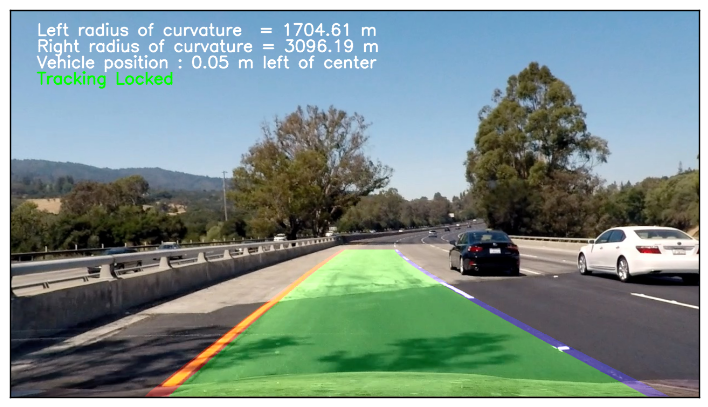

In [20]:
def process_image(image, key_frame_interval=20, cache_length=10):    
    if process_image.cache is None:
                
        left_lane = Lane(int(0.16*image.shape[0]), image.shape[:2], cache_length=cache_length)
        right_lane = Lane(int(0.62*image.shape[0]), image.shape[:2], cache_length=cache_length)

        cache = {'warp_m': None,
                 'warp_minv': None,
                 'frame_ctr': 0,
                 'left': left_lane,
                 'right': right_lane,
                 'base_pts': None}
    else:
        cache = process_image.cache
    

    left_lane = cache['left']
    right_lane = cache['right']

    # Preprocess image and find edges using thresholding
    undist = cv2.undistort(image, mtx, dist, None, mtx) # Check TODO
    
    if cache['warp_m'] is None:# or cache['frame_ctr'] % key_frame_interval == 0:
        src = find_perspective_points(undist)
        warp_m, warp_minv = get_perspective_transform(image, src_in = src)
        
        if src is not None:
            # Save only if customized perspective transform is found
            cache['warp_m'] = warp_m
            cache['warp_minv'] = warp_minv
    else:
        warp_m, warp_minv = cache['warp_m'], cache['warp_minv']
    
    warp_img = cv2.warpPerspective(undist, warp_m, (image.shape[1], image.shape[0]), flags=cv2.INTER_LINEAR)
    warp_edges = find_edges(warp_img)
    
    base_pts = cache['base_pts']
    if base_pts is None: #or cache['frame_ctr'] % key_frame_interval == 0:
        new_base_pts, _ = find_base_points(warp_edges)

        if new_base_pts is not None:
            base_pts = new_base_pts
        else:
            # Could not find new base points
            # Re-use previous data if base points could not be found
            cache['frame_ctr'] = cache['frame_ctr'] - 1 # Make sure we try again in the next frame
            return undist

    if ((left_lane.current_xfit is None or left_lane.dropped_frames > 16) 
            or (right_lane.current_xfit is None or right_lane.dropped_frames > 16)):
        # Detect from scratch
        left_lane.radius_of_curvature = None
        right_lane.radius_of_curvature = None
        histogram_lane_detection(warp_edges, left_lane, right_lane, base_pts)
    else:
        left_lane.detect_from_mask(warp_edges)
        right_lane.detect_from_mask(warp_edges)

    cache['frame_ctr'] = cache['frame_ctr'] + 1
    cache['base_pts'] = base_pts
    process_image.cache = cache
    
    # Create an image to draw the lines on
    color_warp = np.zeros_like(image).astype(np.uint8)
    
    yvals = left_lane.yvals
    left_fitx = left_lane.current_xfit
    right_fitx = right_lane.current_xfit
    
    # Create an image to draw the lines on
    color_warp = np.zeros_like(image).astype(np.uint8)

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, yvals]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, yvals])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))    

    # Draw lane markers
    pts = np.transpose(np.vstack([left_lane.current_xfit, left_lane.yvals])).reshape((-1,1,2)).astype(np.int32)
    cv2.drawContours(color_warp, pts, -1, (255,0,0), thickness=30)
    pts = np.transpose(np.vstack([right_lane.current_xfit, right_lane.yvals])).reshape((-1,1,2)).astype(np.int32)
    cv2.drawContours(color_warp, pts, -1, (0,0,255), thickness=30)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, warp_minv, (image.shape[1], image.shape[0])) 
    
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    left_r = left_lane.radius_of_curvature
    right_r = right_lane.radius_of_curvature
    middle = (left_fitx[-1] + right_fitx[-1])//2
    veh_pos = image.shape[1]//2
    
    dx = (veh_pos - middle)*xm_per_pix # Positive if on right, Negative on left

    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(result,'Left radius of curvature  = %.2f m'%(left_r),(50,50), font, 1,(255,255,255),2, cv2.LINE_AA)
    cv2.putText(result,'Right radius of curvature = %.2f m'%(right_r),(50,80), font, 1,(255,255,255),2, cv2.LINE_AA)
    cv2.putText(result,'Vehicle position : %.2f m %s of center'%(abs(dx), 'left' if dx < 0 else 'right'), (50,110), 
                        font, 1,(255,255,255),2,cv2.LINE_AA)

    is_tracking = left_lane.detected or right_lane.detected
    cv2.putText(result,'Tracking Locked' if is_tracking else 'Tracking Lost',(50,140),
            font, 1,(0,255,0) if is_tracking else (255,0,0), 2, cv2.LINE_AA)

    plt.subplot(1,2,1)
    plt.imshow(left_lane.mask, cmap='gray')
    plt.xticks([],[])
    plt.yticks([],[])
    plt.xlabel('Left lane mask')

    plt.subplot(1,2,2)
    plt.imshow(right_lane.mask, cmap='gray')
    plt.xticks([],[])
    plt.yticks([],[])
    plt.xlabel('Right lane mask')
    
    cache['left'] = left_lane
    cache['right'] = right_lane

    return result

def clear_cache():
    process_image.cache = None
    
process_image.clear_cache = clear_cache
clear_cache()
image = mpimg.imread('test_images/test4.jpg')
%time process_image(image)
%time process_image(image)
out = process_image(image)
out2 = process_image(image)
plt.figure(figsize=(10,5))
# plt.subplot(1,2,1)
# plt.imshow(out)
# plt.subplot(1,2,2)
# plt.imshow(out2)
plt.imshow(out)
plt.xticks([],[])
plt.yticks([],[])
plt.show()

In [21]:
vid_output = 'project_video_out.mp4'
clip = VideoFileClip('project_video.mp4')

[MoviePy] >>>> Building video project_video_out.mp4
[MoviePy] Writing video project_video_out.mp4


100%|█████████▉| 1260/1261 [04:47<00:00,  4.63it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out.mp4 



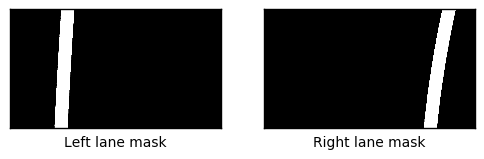

In [22]:
clear_cache()
vid_clip = clip.fl_image(process_image)
vid_clip.write_videofile(vid_output, audio=False)

In [23]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(vid_output))

[MoviePy] >>>> Building video challenge_video_out.mp4
[MoviePy] Writing video challenge_video_out.mp4


100%|██████████| 485/485 [02:05<00:00,  2.49it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_out.mp4 

CPU times: user 3min 9s, sys: 16 s, total: 3min 25s
Wall time: 2min 7s


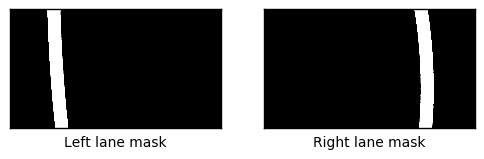

In [24]:
clear_cache()
vid_output = 'challenge_video_out.mp4'
clip2 = VideoFileClip('challenge_video.mp4')
vid_clip = clip2.fl_image(process_image)
%time vid_clip.write_videofile(vid_output, audio=False)

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(vid_output))


[MoviePy] >>>> Building video harder_challenge_video_out.mp4
[MoviePy] Writing video harder_challenge_video_out.mp4


100%|█████████▉| 1199/1200 [04:02<00:00,  5.32it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_out.mp4 

CPU times: user 7min 4s, sys: 35 s, total: 7min 39s
Wall time: 4min 4s


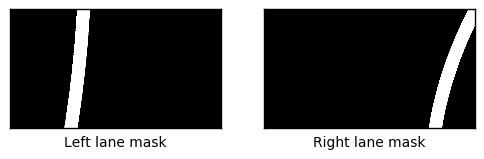

In [25]:
clear_cache()
vid_output = 'harder_challenge_video_out.mp4'
clip2 = VideoFileClip('harder_challenge_video.mp4')
vid_clip = clip2.fl_image(process_image)
%time vid_clip.write_videofile(vid_output, audio=False)

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(vid_output))
